# Web Mining
## Documentation and Presentation
### Phase 5 by Illia Nesterenko, CSAI-12

### Introduction

This notebook contains the final report for the fifth phase of the Web Mining project. The end goal of the project is to "explore how artificial intelligence can be applied to extract meaningful entities from vast textual data and establish connections between them". The fifth phase of the project aims to "compile a comprehensive final report covering all aspects of the project, from introduction to results."

## Phase 1: Entity Recognition and Linking with Wikipedia API

The first phase of the project covers all of "setting the scene" parts including: defining the topic, extracting data via Wikipedia API and storing scraped pages in a JSON pages.

### 1.1. Identify Topics
Goal: Choose specific topics or categories of interest
for entity extraction. This could be based on user input,
predefined categories, or a mix of both. 

For this project I decided to choose a predefined topic: **Russian Invasion of Ukraine**.

### 1.2. Wikipedia API Integration
Goal: Implement code to interact with
the Wikipedia API to fetch relevant pages based on the
identified topics. Explore different API endpoints for extracting
content (e.g., action=query, prop=extracts).

After I have examined Wikipedia API, I found out that the most straightforward way to get the pages was to query relevant titles, capture page ids of the relevant articles. Then, via page ids obtain the URLs to the articles and use those URLs to get page contents. Finally, the content of the pages as well as URLs and page titles will be saved in JSON for further data processing. To complete all this we need only two Python libraries: _requests_ for making API queries and _json_ for storing data. Also, we will use _BeautifulSoup_ to illustrate parced pages.

NB: Later, however, I found out that it would be much easier to access the text of the articles via `wikipediaapi` library. So, after the phase 1 and 2 I re-wrote the previous code into a Python script that contain both data extraction and preparation.

#### 1.2.1. Query page ids

```
{'batchcomplete': '',
 'continue': {'sroffset': 3, 'continue': '-||'},
 'query': {'searchinfo': {'totalhits': 43810},
  'search': [{'ns': 0,
    'title': 'Russo-Ukrainian War',
    'pageid': 42085878,
    'size': 307171,
    'wordcount': 24480,
    'snippet': 'Russo-<span class="searchmatch">Ukrainian</span> <span class="searchmatch">War</span> is an ongoing <span class="searchmatch">war</span> between <span class="searchmatch">Russia</span> and <span class="searchmatch">Ukraine</span>, which began in February 2014. Following <span class="searchmatch">Ukraine\'s</span> Revolution of Dignity, <span class="searchmatch">Russia</span> occupied',
    'timestamp': '2024-04-11T15:32:37Z'},
   {'ns': 0,
    'title': 'Russian invasion of Ukraine',
    'pageid': 70149799,
    'size': 389296,
    'wordcount': 33997,
    'snippet': 'On 24 February 2022, <span class="searchmatch">Russia</span> invaded <span class="searchmatch">Ukraine</span> in an escalation of the Russo-<span class="searchmatch">Ukrainian</span> <span class="searchmatch">War</span> that started in 2014. The invasion became the largest attack on',
    'timestamp': '2024-04-11T08:03:38Z'},
   {'ns': 0,
    'title': 'War crimes in the Russian invasion of Ukraine',
    'pageid': 70167888,
    'size': 258957,
    'wordcount': 23886,
    'snippet': 'Since the beginning of the <span class="searchmatch">Russian</span> invasion of <span class="searchmatch">Ukraine</span> in 2022, the <span class="searchmatch">Russian</span> military and authorities have committed <span class="searchmatch">war</span> crimes, such as deliberate attacks',
    'timestamp': '2024-04-11T10:53:01Z'}]}}
```

Above is the illustration of the result of a successful query. Here we can see matching results. I decided to limit the number of pages to three so that it would be easier to test and illustrate the whole pipeline. Later, as the amount of data needed for the project grew, the limit was changed to thirteen.

```
{'Russo-Ukrainian War': 42085878,
 'Russian invasion of Ukraine': 70149799,
 'War crimes in the Russian invasion of Ukraine': 70167888}
```

Above is the intermediate result in the form of a dictionary with page titles as keys and corresponding page is and values. Next, we will iterate through this dictionary to get page URLs.

#### 1.2.2 Query URLs via page_ids

```
{'Russo-Ukrainian War': 'https://en.wikipedia.org/wiki/Russo-Ukrainian_War',
 'Russian invasion of Ukraine': 'https://en.wikipedia.org/wiki/Russian_invasion_of_Ukraine',
 'War crimes in the Russian invasion of Ukraine': 'https://en.wikipedia.org/wiki/War_crimes_in_the_Russian_invasion_of_Ukraine'}
```

After making another API call to Wiki servers we extract the page urls via the page ids. Now, with the URLs at hand we can make a HTTP GET request and obtain the contents with the page.

### 1.3. Data Storage
Goal: Design a data structure to store the retrieved
Wikipedia pages. Consider using a suitable data format, such
as JSON or a database, to organize and store the data.

In the beginning I faced a pseudo-dilema of whether I should save only URLs and later make new HTTP requests and get the data of should I just save the contents of a page. Fortunately I decided to save both in list and the connect this list to a title in dictionary.

In the end, I saved data in a JSON format. First, I used try-except-else statements to check if there is a file containing data. If not, then a new file is created a filled with the data from current session. If there is a file, then the old data are loaded and new data are appended. Finally, the updated data was written back to the file. On top of that, the writing process was executed piece by piece to avoid duplicates. Overall, this way may create a bottleneck in the future due to extensive read-write workload. But as for now, it works alrights, so the benefit of not spamming a bunch of JSON files overcomers the possible drawbacks.

Later, I decided that I can access the text via an API call and derive the url of the Wiki page by its title, so afte some revision I've changed the `aritcles.json` file to contain the following information:

```
{
    "Russo-Ukrainian War": "Russo-Ukrainian_War",
    "Russian invasion of Ukraine": "Russian_invasion_of_Ukraine",
    "War crimes in the Russian invasion of Ukraine": "War_crimes_in_the_Russian_invasion_of_Ukraine",
    "Casualties of the Russo-Ukrainian War": "Casualties_of_the_Russo-Ukrainian_War",
    "Disinformation in the Russian invasion of Ukraine": "Disinformation_in_the_Russian_invasion_of_Ukraine",
    "List of aircraft losses during the Russo-Ukrainian War": "List_of_aircraft_losses_during_the_Russo-Ukrainian_War",
    "War in Donbas": "War_in_Donbas",
    "List of wars between Russia and Ukraine": "List_of_wars_between_Russia_and_Ukraine",
    "Russian-occupied territories of Ukraine": "Russian-occupied_territories_of_Ukraine",
    "Russian information war against Ukraine": "Russian_information_war_against_Ukraine",
    "Child abductions in the Russo-Ukrainian War": "Child_abductions_in_the_Russo-Ukrainian_War",
    "Timeline of the Russian invasion of Ukraine": "Timeline_of_the_Russian_invasion_of_Ukraine",
    "Russian war crimes": "Russian_war_crimes"
}
```

As we can see, it contains the name of the topic with its underscores copy from which the url can be derived.

This concludes the first phase of a project.
<hr>

## Phase 2: Preprocessing and Named Entity Recognition

The second phase of the project covers all of "text preprocessing" parts including: tokenization, romoving stop words, handling special characters, implementing named entity recognition (NER), entitity linking and exporting the results in a .csv file.

### 2.1. Text Preprocessing:
Goal: Clean and preprocess the text data
obtained from Wikipedia pages. Perform tasks like
tokenization, removing stop words, and handling special
characters.

For tokenization, we use nltk's ```word_tokenize()``` function. For removing stopwords we use nltk's list of English stopwords. For handling spectial charactes we use ```re``` library and its ```sub()``` function. The process takes just 5 rows of code to get clean preprocessed text.

```
# Tokenization
tokens = word_tokenize(article_text)

# Removing stop words
stop_words = set(stopwords.words('english'))
filtered_tokens = [word for word in tokens if word.lower() not in stop_words]

# Handling special characters and lowercasing
cleaned_tokens = [re.sub(r'[^a-zA-Z0-9]', '', word.lower()) for word in filtered_tokens if word.isalnum()]

# Convert list of cleaned tokens back to a string
cleaned_text = ' '.join(cleaned_tokens)
```

### 2.2. Named Entity Recognition
Goal: Implement NER using libraries like SpaCy or NLTK. Extract entities such as persons, organizations, locations, etc., from the preprocessed text.

I decide to use Spacy for NER. I have checked the avaliable lables it captures and choose the most relevant for the task. This list of the entites' labels can be seen below.

```
valid_entities = ['PERSON','NORP','FAC','ORG','GPE','LOC','PRODUCT','EVENT','WORK_OF_ART','LAW','LANGUAGE']

# Load SpaCy's English language model
nlp = spacy.load("en_core_web_sm")

# Process the preprocessed text
doc = nlp(cleaned_text)

# # Extract named entities
entities = [(entity.text, entity.label_) for entity in doc.ents if entity.label_ in valid_entities]
```

Now, we filter through the list of found entities and select only unique ones. Below is the example of a filtered entities:

```
[('russia', 'GPE'), ('ukraine', 'GPE'), ('russian', 'NORP'), ('donbas', 'GPE'), ('donbas war', 'ORG'), ('vladimir putin', 'PERSON'), ('nato', 'ORG'), ('putin', 'PERSON'), ('soviet', 'NORP'), ('kingdom united states', 'GPE'), ('european', 'NORP'), ('eastern bloc', 'LOC'), ('first chechen war', 'EVENT'), ('viktor yushchenko', 'PERSON'), ('supreme court', 'ORG'), ('yulia', 'GPE'), ('anthony cordesman', 'PERSON'), ('favour putin', 'PERSON'), ('georgia', 'GPE'), ('western european', 'NORP'), ('ukraine georgia', 'GPE'), ('us', 'GPE'), ('george bush', 'PERSON'), ('georgia ukraine', 'ORG'), ('eurasian', 'NORP'), ('eu', 'GPE'), ('kremlin', 'ORG'), ('rada', 'GPE'), ('ukraine russia', 'PERSON'), ('crimean', 'GPE'), ('kacha hvardiiske simferopol', 'PERSON'), ('insignia', 'GPE'), ('aksyonov', 'NORP'), ('ukraine putin', 'PERSON'), ('donbas part', 'ORG'), ('chechen', 'NORP'), ('un', 'ORG'), ('eastern ukraine', 'NORP'), ('insignia girkin', 'ORG'), ('malaysia', 'GPE'), ('united banner', 'ORG'), ('nikolai mitrokhin', 'PERSON'), ('novoazovsk azov sea coast', 'FAC'), ('novoazovsk', 'GPE'), ('mariupol un security council', 'ORG'), ('luhansk suffering', 'ORG'), ('defence ministry', 'ORG'), ('luhansk', 'GPE'), ('house', 'ORG'), ('novaya gazeta', 'PERSON'), ('lev shlosberg', 'PERSON'), ('valentina matviyenko', 'PERSON'), ('andrey kelin', 'PERSON'), ('kelin', 'ORG'), ('philip breedlove', 'PERSON'), ('moscow', 'GPE'), ('chicago council global affairs', 'ORG'), ('united nations security council', 'ORG'), ('united kingdom', 'ORG'), ('united nations human rights office estimated 8000', 'ORG'), ('vladimir yefimov', 'PERSON'), ('red cross', 'ORG'), ('konstantin zatulin', 'PERSON'), ('volodymyr zelenskyy', 'PERSON'), ('ukraine separatists', 'PERSON'), ('nato eu', 'FAC'), ('vladimir lenin', 'PERSON'), ('soviet republic putin', 'GPE'), ('nikita khrushchev', 'PERSON'), ('world war ii', 'EVENT'), ('russian christians', 'NORP'), ('jews', 'NORP'), ('nazi germany', 'GPE'), ('jewish', 'NORP'), ('jens stoltenberg', 'PERSON'), ('evacuations donbas', 'PERSON'), ('federation council', 'ORG'), ('conscription army', 'ORG'), ('eastern ukraine command', 'ORG'), ('aleksandr dvornikov', 'ORG'), ('europe', 'LOC'), ('yugoslav', 'NORP'), ('russians', 'NORP'), ('east bank', 'GPE'), ('united nations general assembly resolution', 'ORG'), ('cnn', 'ORG'), ('khartoum', 'GPE'), ('budanov', 'PERSON'), ('romanian', 'NORP'), ('nord stream pipeline', 'ORG'), ('yuzivska', 'ORG'), ('arsen avakov', 'PERSON'), ('balkan', 'LOC'), ('germany', 'GPE'), ('joe biden', 'PERSON'), ('german', 'NORP'), ('angela merkel', 'PERSON'), ('nord stream political', 'ORG'), ('poland', 'GPE'), ('nord', 'ORG'), ('ukraine naftogaz', 'GPE'), ('yuriy vitrenko', 'PERSON'), ('united states', 'GPE'), ('communist party', 'ORG'), ('syria', 'GPE'), ('iraq', 'GPE'), ('vladislav surkov', 'PERSON'), ('putin russian', 'PERSON'), ('zelenskyy jewish', 'PERSON'), ('natalia', 'GPE'), ('antonova', 'GPE'), ('world war ii ukraine rejection adoption general assembly resolutions combating', 'EVENT'), ('nazi', 'NORP'), ('dmitry medvedev', 'PERSON'), ('medvedev', 'PERSON'), ('medvedev described', 'PERSON'), ('southern city', 'LOC'), ('american', 'NORP'), ('nafo north atlantic', 'PERSON'), ('cartoon shiba inu dogs social media', 'ORG'), ('mikhail ulyanov', 'PERSON'), ('ukrainians', 'NORP'), ('islamic', 'NORP'), ('crocus', 'ORG'), ('krasnogorsk moscow', 'FAC'), ('russia defense ministry', 'ORG'), ('ukraine russian', 'NORP'), ('church hierarch patriarch', 'ORG'), ('germany university', 'ORG'), ('al jazeera roc', 'ORG'), ('nakaz decree council present', 'ORG'), ('roc protodeacon', 'PERSON'), ('christians', 'NORP'), ('sergey lavrov', 'PERSON'), ('eastern', 'ORG'), ('cia', 'ORG'), ('leon panetta', 'PERSON'), ('abc', 'ORG'), ('oleksandr turchynov', 'PERSON'), ('abkhazia south ossetia', 'ORG'), ('soviet union', 'GPE'), ('battalion ukrainian national guard american forces', 'ORG'), ('pentagon', 'ORG'), ('russian european', 'NORP'), ('swiss franc climb high dollar high euro', 'ORG'), ('australian', 'NORP'), ('crimea taken international republican institute', 'ORG'), ('western ukraine', 'NORP'), ('levada', 'ORG'), ('ukraine street', 'GPE'), ('ukraine donbas', 'GPE'), ('congress', 'ORG'), ('afghanistan', 'GPE'), ('washington', 'GPE'), ('timothy snyder', 'PERSON'), ('new york times', 'ORG'), ('revival putin', 'PERSON'), ('putin justification', 'PERSON'), ('christian', 'NORP'), ('putin adolf hitler conquests', 'PERSON'), ('iran', 'GPE'), ('north korea', 'GPE'), ('china', 'GPE'), ('chinese', 'NORP'), ('arab', 'NORP'), ('south africa', 'GPE'), ('south african', 'NORP'), ('united nations', 'ORG'), ('united nations general assembly', 'ORG'), ('nicaragua', 'GPE'), ('encyclopdia britannica', 'FAC'), ('google news war', 'ORG'), ('bbc news', 'ORG')]
```

### 2.3. Entity Linking
Goal: Integrate entity linking to associate recognized
entities with their corresponding Wikipedia pages. Use the
Wikipedia API to enhance entity information.

We implement task 3 by specifying a function to fetch Wikipedia article for an entity (if it exists). Then, we add its URL to the list of found entities.

```
# Function to fetch Wikipedia page for an entity
def fetch_wikipedia_page(entity):
    page = wiki.page(entity)
    if page.exists():
        return page.fullurl
    else:
        return None

# Entity linking
linked_entities = []
for entity_text, entity_label in filtered_entities:
    # Fetch Wikipedia page for the entity
    page_url = fetch_wikipedia_page(entity_text)
    if page_url:
        linked_entities.append((entity_text, entity_label, page_url))
    else:
        linked_entities.append((entity_text, entity_label, None))

```

Below is the example of an output with linked entities:

```
[('russia', 'GPE', 'https://en.wikipedia.org/wiki/Russia'), ('ukraine', 'GPE', 'https://en.wikipedia.org/wiki/Ukraine'), ('russian', 'NORP', 'https://en.wikipedia.org/wiki/Russian'), ('donbas', 'GPE', 'https://en.wikipedia.org/wiki/Donbas'), ('donbas war', 'ORG', 'https://en.wikipedia.org/wiki/War_in_Donbas'), ('vladimir putin', 'PERSON', 'https://en.wikipedia.org/wiki/Vladimir_Putin'), ('nato', 'ORG', 'https://en.wikipedia.org/wiki/NATO'), ('putin', 'PERSON', 'https://en.wikipedia.org/wiki/Vladimir_Putin'), ('soviet', 'NORP', 'https://en.wikipedia.org/wiki/Soviet_Union'), ('kingdom united states', 'GPE', None), ('european', 'NORP', 'https://en.wikipedia.org/wiki/European'), ('eastern bloc', 'LOC', 'https://en.wikipedia.org/wiki/Eastern_Bloc'), ('first chechen war', 'EVENT', 'https://en.wikipedia.org/wiki/First_Chechen_War'), ('viktor yushchenko', 'PERSON', None), ('supreme court', 'ORG', 'https://en.wikipedia.org/wiki/Supreme_court'), ('yulia', 'GPE', 'https://en.wikipedia.org/wiki/Yulia'), ('anthony cordesman', 'PERSON', None), ('favour putin', 'PERSON', None), ('georgia', 'GPE', 'https://en.wikipedia.org/wiki/Georgia'), ('western european', 'NORP', 'https://en.wikipedia.org/wiki/Western_Europe'), ('ukraine georgia', 'GPE', None), ('us', 'GPE', 'https://en.wikipedia.org/wiki/Us'), ('george bush', 'PERSON', 'https://en.wikipedia.org/wiki/George_Bush'), ('georgia ukraine', 'ORG', None), ('eurasian', 'NORP', 'https://en.wikipedia.org/wiki/Eurasia'), ('eu', 'GPE', 'https://en.wikipedia.org/wiki/European_Union'), ('kremlin', 'ORG', 'https://en.wikipedia.org/wiki/Kremlin'), ('rada', 'GPE', 'https://en.wikipedia.org/wiki/Rada'), ('ukraine russia', 'PERSON', None), ('crimean', 'GPE', 'https://en.wikipedia.org/wiki/Crimea'), ('kacha hvardiiske simferopol', 'PERSON', None), ('insignia', 'GPE', 'https://en.wikipedia.org/wiki/Insignia'), ('aksyonov', 'NORP', 'https://en.wikipedia.org/wiki/Aksyonov'), ('ukraine putin', 'PERSON', None), ('donbas part', 'ORG', None), ('chechen', 'NORP', 'https://en.wikipedia.org/wiki/Chechen'), ('un', 'ORG', 'https://en.wikipedia.org/wiki/UN_(disambiguation)'), ('eastern ukraine', 'NORP', None), ('insignia girkin', 'ORG', None), ('malaysia', 'GPE', 'https://en.wikipedia.org/wiki/Malaysia'), ('united banner', 'ORG', None), ('nikolai mitrokhin', 'PERSON', None), ('novoazovsk azov sea coast', 'FAC', None), ('novoazovsk', 'GPE', 'https://en.wikipedia.org/wiki/Novoazovsk'), ('mariupol un security council', 'ORG', None), ('luhansk suffering', 'ORG', None), ('defence ministry', 'ORG', 'https://en.wikipedia.org/wiki/Ministry_of_defence'), ('luhansk', 'GPE', 'https://en.wikipedia.org/wiki/Luhansk'), ('house', 'ORG', 'https://en.wikipedia.org/wiki/House'), ('novaya gazeta', 'PERSON', 'https://en.wikipedia.org/wiki/Novaya_Gazeta'), ('lev shlosberg', 'PERSON', None), ('valentina matviyenko', 'PERSON', None), ('andrey kelin', 'PERSON', None), ('kelin', 'ORG', 'https://en.wikipedia.org/wiki/Kelin'), ('philip breedlove', 'PERSON', None), ('moscow', 'GPE', 'https://en.wikipedia.org/wiki/Moscow'), ('chicago council global affairs', 'ORG', None), ('united nations security council', 'ORG', None), ('united kingdom', 'ORG', 'https://en.wikipedia.org/wiki/United_Kingdom'), ('united nations human rights office estimated 8000', 'ORG', None), ('vladimir yefimov', 'PERSON', None), ('red cross', 'ORG', 'https://en.wikipedia.org/wiki/International_Red_Cross_and_Red_Crescent_Movement'), ('konstantin zatulin', 'PERSON', None), ('volodymyr zelenskyy', 'PERSON', 'https://en.wikipedia.org/wiki/Volodymyr_Zelenskyy'), ('ukraine separatists', 'PERSON', None), ('nato eu', 'FAC', None), ('vladimir lenin', 'PERSON', 'https://en.wikipedia.org/wiki/Vladimir_Lenin'), ('soviet republic putin', 'GPE', None), ('nikita khrushchev', 'PERSON', 'https://en.wikipedia.org/wiki/Nikita_Khrushchev'), ('world war ii', 'EVENT', 'https://en.wikipedia.org/wiki/World_War_II'), ('russian christians', 'NORP', None), ('jews', 'NORP', 'https://en.wikipedia.org/wiki/Jews'), ('nazi germany', 'GPE', 'https://en.wikipedia.org/wiki/Nazi_Germany'), ('jewish', 'NORP', 'https://en.wikipedia.org/wiki/Jews'), ('jens stoltenberg', 'PERSON', None), ('evacuations donbas', 'PERSON', None), ('federation council', 'ORG', None), ('conscription army', 'ORG', None), ('eastern ukraine command', 'ORG', None), ('aleksandr dvornikov', 'ORG', None), ('europe', 'LOC', 'https://en.wikipedia.org/wiki/Europe'), ('yugoslav', 'NORP', 'https://en.wikipedia.org/wiki/Yugoslav'), ('russians', 'NORP', 'https://en.wikipedia.org/wiki/Russians'), ('east bank', 'GPE', None), ('united nations general assembly resolution', 'ORG', None), ('cnn', 'ORG', 'https://en.wikipedia.org/wiki/CNN'), ('khartoum', 'GPE', 'https://en.wikipedia.org/wiki/Khartoum'), ('budanov', 'PERSON', 'https://en.wikipedia.org/wiki/Budanov'), ('romanian', 'NORP', 'https://en.wikipedia.org/wiki/Romanian'), ('nord stream pipeline', 'ORG', None), ('yuzivska', 'ORG', None), ('arsen avakov', 'PERSON', None), ('balkan', 'LOC', 'https://en.wikipedia.org/wiki/Balkans'), ('germany', 'GPE', 'https://en.wikipedia.org/wiki/Germany'), ('joe biden', 'PERSON', 'https://en.wikipedia.org/wiki/Joe_Biden'), ('german', 'NORP', 'https://en.wikipedia.org/wiki/German'), ('angela merkel', 'PERSON', 'https://en.wikipedia.org/wiki/Angela_Merkel'), ('nord stream political', 'ORG', None), ('poland', 'GPE', 'https://en.wikipedia.org/wiki/Poland'), ('nord', 'ORG', 'https://en.wikipedia.org/wiki/Nord'), ('ukraine naftogaz', 'GPE', None), ('yuriy vitrenko', 'PERSON', None), ('united states', 'GPE', 'https://en.wikipedia.org/wiki/United_States'), ('communist party', 'ORG', 'https://en.wikipedia.org/wiki/Communist_party'), ('syria', 'GPE', 'https://en.wikipedia.org/wiki/Syria'), ('iraq', 'GPE', 'https://en.wikipedia.org/wiki/Iraq'), ('vladislav surkov', 'PERSON', 'https://en.wikipedia.org/wiki/Vladislav_Surkov'), ('putin russian', 'PERSON', None), ('zelenskyy jewish', 'PERSON', None), ('natalia', 'GPE', 'https://en.wikipedia.org/wiki/Natalia'), ('antonova', 'GPE', 'https://en.wikipedia.org/wiki/Antonova'), ('world war ii ukraine rejection adoption general assembly resolutions combating', 'EVENT', None), ('nazi', 'NORP', 'https://en.wikipedia.org/wiki/Nazism'), ('dmitry medvedev', 'PERSON', None), ('medvedev', 'PERSON', 'https://en.wikipedia.org/wiki/Medvedev'), ('medvedev described', 'PERSON', None), ('southern city', 'LOC', None), ('american', 'NORP', 'https://en.wikipedia.org/wiki/American'), ('nafo north atlantic', 'PERSON', None), ('cartoon shiba inu dogs social media', 'ORG', None), ('mikhail ulyanov', 'PERSON', None), ('ukrainians', 'NORP', 'https://en.wikipedia.org/wiki/Ukrainians'), ('islamic', 'NORP', 'https://en.wikipedia.org/wiki/Islam'), ('crocus', 'ORG', 'https://en.wikipedia.org/wiki/Crocus'), ('krasnogorsk moscow', 'FAC', None), ('russia defense ministry', 'ORG', None), ('ukraine russian', 'NORP', None), ('church hierarch patriarch', 'ORG', None), ('germany university', 'ORG', 'https://en.wikipedia.org/wiki/List_of_universities_in_Germany'), ('al jazeera roc', 'ORG', None), ('nakaz decree council present', 'ORG', None), ('roc protodeacon', 'PERSON', None), ('christians', 'NORP', 'https://en.wikipedia.org/wiki/Christians'), ('sergey lavrov', 'PERSON', None), ('eastern', 'ORG', 'https://en.wikipedia.org/wiki/Eastern'), ('cia', 'ORG', 'https://en.wikipedia.org/wiki/Central_Intelligence_Agency'), ('leon panetta', 'PERSON', None), ('abc', 'ORG', 'https://en.wikipedia.org/wiki/ABC'), ('oleksandr turchynov', 'PERSON', None), ('abkhazia south ossetia', 'ORG', None), ('soviet union', 'GPE', 'https://en.wikipedia.org/wiki/Soviet_Union'), ('battalion ukrainian national guard american forces', 'ORG', None), ('pentagon', 'ORG', 'https://en.wikipedia.org/wiki/Pentagon'), ('russian european', 'NORP', None), ('swiss franc climb high dollar high euro', 'ORG', None), ('australian', 'NORP', 'https://en.wikipedia.org/wiki/Australian'), ('crimea taken international republican institute', 'ORG', None), ('western ukraine', 'NORP', None), ('levada', 'ORG', 'https://en.wikipedia.org/wiki/Levada'), ('ukraine street', 'GPE', None), ('ukraine donbas', 'GPE', None), ('congress', 'ORG', 'https://en.wikipedia.org/wiki/Congress'), ('afghanistan', 'GPE', 'https://en.wikipedia.org/wiki/Afghanistan'), ('washington', 'GPE', 'https://en.wikipedia.org/wiki/Washington'), ('timothy snyder', 'PERSON', None), ('new york times', 'ORG', 'https://en.wikipedia.org/wiki/The_New_York_Times'), ('revival putin', 'PERSON', None), ('putin justification', 'PERSON', None), ('christian', 'NORP', 'https://en.wikipedia.org/wiki/Christians'), ('putin adolf hitler conquests', 'PERSON', None), ('iran', 'GPE', 'https://en.wikipedia.org/wiki/Iran'), ('north korea', 'GPE', 'https://en.wikipedia.org/wiki/North_Korea'), ('china', 'GPE', 'https://en.wikipedia.org/wiki/China'), ('chinese', 'NORP', 'https://en.wikipedia.org/wiki/Chinese'), ('arab', 'NORP', 'https://en.wikipedia.org/wiki/Arabs'), ('south africa', 'GPE', 'https://en.wikipedia.org/wiki/South_Africa'), ('south african', 'NORP', None), ('united nations', 'ORG', 'https://en.wikipedia.org/wiki/United_Nations'), ('united nations general assembly', 'ORG', None), ('nicaragua', 'GPE', 'https://en.wikipedia.org/wiki/Nicaragua'), ('encyclopdia britannica', 'FAC', None), ('google news war', 'ORG', None), ('bbc news', 'ORG', 'https://en.wikipedia.org/wiki/BBC_News')]
```

Finally, we create pandas Dataframe and drop the entities with no URLs. Procuded result we export to the .csv file.

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Entity</th>
      <th>Label</th>
      <th>URL</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>0</th>
      <td>russia</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Russia</td>
    </tr>
    <tr>
      <th>1</th>
      <td>ukraine</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Ukraine</td>
    </tr>
    <tr>
      <th>2</th>
      <td>russian</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Russian</td>
    </tr>
    <tr>
      <th>3</th>
      <td>donbas</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Donbas</td>
    </tr>
    <tr>
      <th>4</th>
      <td>donbas war</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/War_in_Donbas</td>
    </tr>
    <tr>
      <th>5</th>
      <td>vladimir putin</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Vladimir_Putin</td>
    </tr>
    <tr>
      <th>6</th>
      <td>nato</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/NATO</td>
    </tr>
    <tr>
      <th>7</th>
      <td>putin</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Vladimir_Putin</td>
    </tr>
    <tr>
      <th>8</th>
      <td>soviet</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Soviet_Union</td>
    </tr>
    <tr>
      <th>10</th>
      <td>european</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/European</td>
    </tr>
    <tr>
      <th>11</th>
      <td>eastern bloc</td>
      <td>LOC</td>
      <td>https://en.wikipedia.org/wiki/Eastern_Bloc</td>
    </tr>
    <tr>
      <th>12</th>
      <td>first chechen war</td>
      <td>EVENT</td>
      <td>https://en.wikipedia.org/wiki/First_Chechen_War</td>
    </tr>
    <tr>
      <th>14</th>
      <td>supreme court</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Supreme_court</td>
    </tr>
    <tr>
      <th>15</th>
      <td>yulia</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Yulia</td>
    </tr>
    <tr>
      <th>18</th>
      <td>georgia</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Georgia</td>
    </tr>
    <tr>
      <th>19</th>
      <td>western european</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Western_Europe</td>
    </tr>
    <tr>
      <th>21</th>
      <td>us</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Us</td>
    </tr>
    <tr>
      <th>22</th>
      <td>george bush</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/George_Bush</td>
    </tr>
    <tr>
      <th>24</th>
      <td>eurasian</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Eurasia</td>
    </tr>
    <tr>
      <th>25</th>
      <td>eu</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/European_Union</td>
    </tr>
    <tr>
      <th>26</th>
      <td>kremlin</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Kremlin</td>
    </tr>
    <tr>
      <th>27</th>
      <td>rada</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Rada</td>
    </tr>
    <tr>
      <th>29</th>
      <td>crimean</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Crimea</td>
    </tr>
    <tr>
      <th>31</th>
      <td>insignia</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Insignia</td>
    </tr>
    <tr>
      <th>32</th>
      <td>aksyonov</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Aksyonov</td>
    </tr>
    <tr>
      <th>35</th>
      <td>chechen</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Chechen</td>
    </tr>
    <tr>
      <th>36</th>
      <td>un</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/UN_(disambiguation)</td>
    </tr>
    <tr>
      <th>39</th>
      <td>malaysia</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Malaysia</td>
    </tr>
    <tr>
      <th>43</th>
      <td>novoazovsk</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Novoazovsk</td>
    </tr>
    <tr>
      <th>46</th>
      <td>defence ministry</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Ministry_of_defence</td>
    </tr>
    <tr>
      <th>47</th>
      <td>luhansk</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Luhansk</td>
    </tr>
    <tr>
      <th>48</th>
      <td>house</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/House</td>
    </tr>
    <tr>
      <th>49</th>
      <td>novaya gazeta</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Novaya_Gazeta</td>
    </tr>
    <tr>
      <th>53</th>
      <td>kelin</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Kelin</td>
    </tr>
    <tr>
      <th>55</th>
      <td>moscow</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Moscow</td>
    </tr>
    <tr>
      <th>58</th>
      <td>united kingdom</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/United_Kingdom</td>
    </tr>
    <tr>
      <th>61</th>
      <td>red cross</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/International_Re...</td>
    </tr>
    <tr>
      <th>63</th>
      <td>volodymyr zelenskyy</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Volodymyr_Zelenskyy</td>
    </tr>
    <tr>
      <th>66</th>
      <td>vladimir lenin</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Vladimir_Lenin</td>
    </tr>
    <tr>
      <th>68</th>
      <td>nikita khrushchev</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Nikita_Khrushchev</td>
    </tr>
    <tr>
      <th>69</th>
      <td>world war ii</td>
      <td>EVENT</td>
      <td>https://en.wikipedia.org/wiki/World_War_II</td>
    </tr>
    <tr>
      <th>71</th>
      <td>jews</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Jews</td>
    </tr>
    <tr>
      <th>72</th>
      <td>nazi germany</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Nazi_Germany</td>
    </tr>
    <tr>
      <th>73</th>
      <td>jewish</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Jews</td>
    </tr>
    <tr>
      <th>80</th>
      <td>europe</td>
      <td>LOC</td>
      <td>https://en.wikipedia.org/wiki/Europe</td>
    </tr>
    <tr>
      <th>81</th>
      <td>yugoslav</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Yugoslav</td>
    </tr>
    <tr>
      <th>82</th>
      <td>russians</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Russians</td>
    </tr>
    <tr>
      <th>85</th>
      <td>cnn</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/CNN</td>
    </tr>
    <tr>
      <th>86</th>
      <td>khartoum</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Khartoum</td>
    </tr>
    <tr>
      <th>87</th>
      <td>budanov</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Budanov</td>
    </tr>
    <tr>
      <th>88</th>
      <td>romanian</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Romanian</td>
    </tr>
    <tr>
      <th>92</th>
      <td>balkan</td>
      <td>LOC</td>
      <td>https://en.wikipedia.org/wiki/Balkans</td>
    </tr>
    <tr>
      <th>93</th>
      <td>germany</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Germany</td>
    </tr>
    <tr>
      <th>94</th>
      <td>joe biden</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Joe_Biden</td>
    </tr>
    <tr>
      <th>95</th>
      <td>german</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/German</td>
    </tr>
    <tr>
      <th>96</th>
      <td>angela merkel</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Angela_Merkel</td>
    </tr>
    <tr>
      <th>98</th>
      <td>poland</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Poland</td>
    </tr>
    <tr>
      <th>99</th>
      <td>nord</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Nord</td>
    </tr>
    <tr>
      <th>102</th>
      <td>united states</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/United_States</td>
    </tr>
    <tr>
      <th>103</th>
      <td>communist party</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Communist_party</td>
    </tr>
    <tr>
      <th>104</th>
      <td>syria</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Syria</td>
    </tr>
    <tr>
      <th>105</th>
      <td>iraq</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Iraq</td>
    </tr>
    <tr>
      <th>106</th>
      <td>vladislav surkov</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Vladislav_Surkov</td>
    </tr>
    <tr>
      <th>109</th>
      <td>natalia</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Natalia</td>
    </tr>
    <tr>
      <th>110</th>
      <td>antonova</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Antonova</td>
    </tr>
    <tr>
      <th>112</th>
      <td>nazi</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Nazism</td>
    </tr>
    <tr>
      <th>114</th>
      <td>medvedev</td>
      <td>PERSON</td>
      <td>https://en.wikipedia.org/wiki/Medvedev</td>
    </tr>
    <tr>
      <th>117</th>
      <td>american</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/American</td>
    </tr>
    <tr>
      <th>121</th>
      <td>ukrainians</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Ukrainians</td>
    </tr>
    <tr>
      <th>122</th>
      <td>islamic</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Islam</td>
    </tr>
    <tr>
      <th>123</th>
      <td>crocus</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Crocus</td>
    </tr>
    <tr>
      <th>128</th>
      <td>germany university</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/List_of_universi...</td>
    </tr>
    <tr>
      <th>132</th>
      <td>christians</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Christians</td>
    </tr>
    <tr>
      <th>134</th>
      <td>eastern</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Eastern</td>
    </tr>
    <tr>
      <th>135</th>
      <td>cia</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Central_Intellig...</td>
    </tr>
    <tr>
      <th>137</th>
      <td>abc</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/ABC</td>
    </tr>
    <tr>
      <th>140</th>
      <td>soviet union</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Soviet_Union</td>
    </tr>
    <tr>
      <th>142</th>
      <td>pentagon</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Pentagon</td>
    </tr>
    <tr>
      <th>145</th>
      <td>australian</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Australian</td>
    </tr>
    <tr>
      <th>148</th>
      <td>levada</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Levada</td>
    </tr>
    <tr>
      <th>151</th>
      <td>congress</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/Congress</td>
    </tr>
    <tr>
      <th>152</th>
      <td>afghanistan</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Afghanistan</td>
    </tr>
    <tr>
      <th>153</th>
      <td>washington</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Washington</td>
    </tr>
    <tr>
      <th>155</th>
      <td>new york times</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/The_New_York_Times</td>
    </tr>
    <tr>
      <th>158</th>
      <td>christian</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Christians</td>
    </tr>
    <tr>
      <th>160</th>
      <td>iran</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Iran</td>
    </tr>
    <tr>
      <th>161</th>
      <td>north korea</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/North_Korea</td>
    </tr>
    <tr>
      <th>162</th>
      <td>china</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/China</td>
    </tr>
    <tr>
      <th>163</th>
      <td>chinese</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Chinese</td>
    </tr>
    <tr>
      <th>164</th>
      <td>arab</td>
      <td>NORP</td>
      <td>https://en.wikipedia.org/wiki/Arabs</td>
    </tr>
    <tr>
      <th>165</th>
      <td>south africa</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/South_Africa</td>
    </tr>
    <tr>
      <th>167</th>
      <td>united nations</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/United_Nations</td>
    </tr>
    <tr>
      <th>169</th>
      <td>nicaragua</td>
      <td>GPE</td>
      <td>https://en.wikipedia.org/wiki/Nicaragua</td>
    </tr>
    <tr>
      <th>172</th>
      <td>bbc news</td>
      <td>ORG</td>
      <td>https://en.wikipedia.org/wiki/BBC_News</td>
    </tr>
  </tbody>
</table>
</div>

This concludes the second phase of a project.
<hr>

## Phase 3: Knowledge Graph Construction

The third phase of the project covers all of "graph visualization" parts including: graph representation, entity relationship analysis and, finally, graph visualization.

### 3.1. Graph Representation
Goal: Choose a suitable representation for the
knowledge graph, such as an adjacency list or adjacency
matrix. Define nodes and edges based on entities and
relationships.

The first and second phases were developed in jupyter notebooks, with the whole process developed for one article. I needed more data to construct a knowledge graph and perform entity relationship analysis, so I rewrote the whole process in a Python script that essentially puts the previous code in "production" and extracts entities for 13 articles on the topic of the Russian-Ukrainian war. The result is the dataset with entities per article (extract):

<div>
<style scoped>
    .dataframe tbody tr th:only-of-type {
        vertical-align: middle;
    }

    .dataframe tbody tr th {
        vertical-align: top;
    }

    .dataframe thead th {
        text-align: right;
    }
</style>
<table border="1" class="dataframe">
  <thead>
    <tr style="text-align: right;">
      <th></th>
      <th>Entity</th>
      <th>Label</th>
      <th>Article</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <th>0</th>
      <td>russia</td>
      <td>GPE</td>
      <td>Russo-Ukrainian War</td>
    </tr>
    <tr>
      <th>1</th>
      <td>ukraine</td>
      <td>GPE</td>
      <td>Russo-Ukrainian War</td>
    </tr>
    <tr>
      <th>2</th>
      <td>russian</td>
      <td>NORP</td>
      <td>Russo-Ukrainian War</td>
    </tr>
    <tr>
      <th>3</th>
      <td>donbas</td>
      <td>GPE</td>
      <td>Russo-Ukrainian War</td>
    </tr>
    <tr>
      <th>4</th>
      <td>donbas war</td>
      <td>ORG</td>
      <td>Russo-Ukrainian War</td>
    </tr>
  </tbody>
</table>
</div>

Below is the number of entities per article. At this point, we can expect the graph to be huge due to a lot of overlapping connections.

```
Article (No. of entities):
Casualties of the Russo-Ukrainian War                      56
Child abductions in the Russo-Ukrainian War                73
Disinformation in the Russian invasion of Ukraine         143
List of aircraft losses during the Russo-Ukrainian War      8
List of wars between Russia and Ukraine                    11
Russian information war against Ukraine                   211
Russian invasion of Ukraine                               245
Russian war crimes                                        128
Russian-occupied territories of Ukraine                    52
Russo-Ukrainian War                                       175
Timeline of the Russian invasion of Ukraine                12
War crimes in the Russian invasion of Ukraine             166
War in Donbas                                             226
```

### 3.2. Entity Relationship Analysis 
Goal: Establish relationships between
entities based on co-occurrence in the same article, references,
or other criteria. Determine the weight or strength of
relationships.

I have established relationships between entities based on co-occurrence in the same article. For this, I have constructed a double for loop that examines co-occurrence between each pair of entities in the articles and saves them in a networkx graph object. Each co-occurrence adds one weight to the relationship.

```
# Create a graph object
G = nx.Graph()

# Add nodes (unique entities)
for entity in df['Entity'].unique():
    G.add_node(entity)

# Iterate over each group to form edges
for entities in grouped_trimmed:
    for i in range(len(entities)):
        for j in range(i + 1, len(entities)):
            if G.has_edge(entities[i], entities[j]):
                # Increase weight if edge already exists
                G[entities[i]][entities[j]]['weight'] += 1
            else:
                # Add new edge with weight 1
                G.add_edge(entities[i], entities[j], weight=1)
```

### 3.3. Graph Visualization
Goal: Utilize graph visualization tools (e.g.,
NetworkX, Gephi) to visualize the constructed knowledge
graph. Experiment with different layouts and configurations.

This was the most challenging part of the project so far. The resulting graph has over 250 vertices, and most of them are connected. Because of that, the number of edges grows astronomically fast. To solve this problem, I decided to explore two options: 
1) visualize the subgraph with lesser number of node and edges (using trimmed dataset);
2) visualize the graph without edges, using placement as an indication of interconnectedness (using the full dataset).

For the first option, I have picked pyvis for additional interactivity. And for the second, I decided to stick with Plotly. Below is the implementation of both approaches.

NB: pyvis did not render properly in VS code or Google Colab environment. So, after that problem, I have switched to plotly.

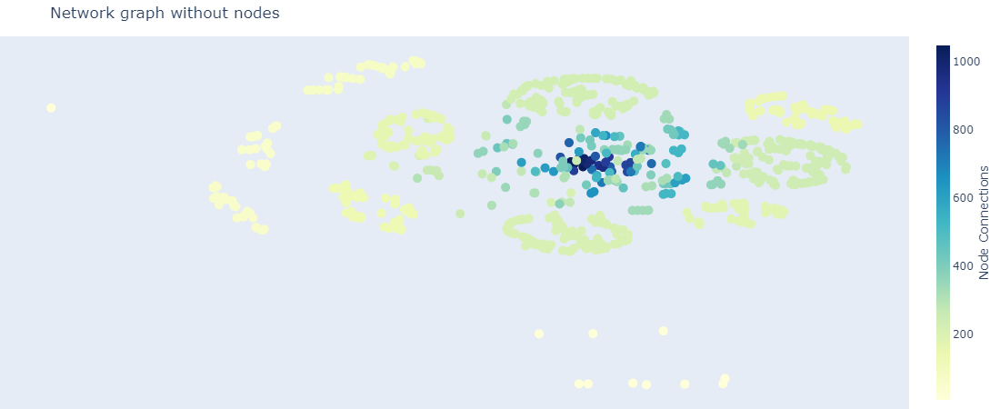

Later, I found out how to leverage networkx for better visualizaation. I have realised it in the phase four.

This concludes the third phase of a project.
<hr>

## Phase 4: Analysis and Interpretation

The fourth phase of the project covers all of "graph analysis" parts, including centrality and cluster analysis.

We will start from visualizing our graph properly. Scaling down edge by lowering alpha, adding edge color, will let us get a proper look at the graph.

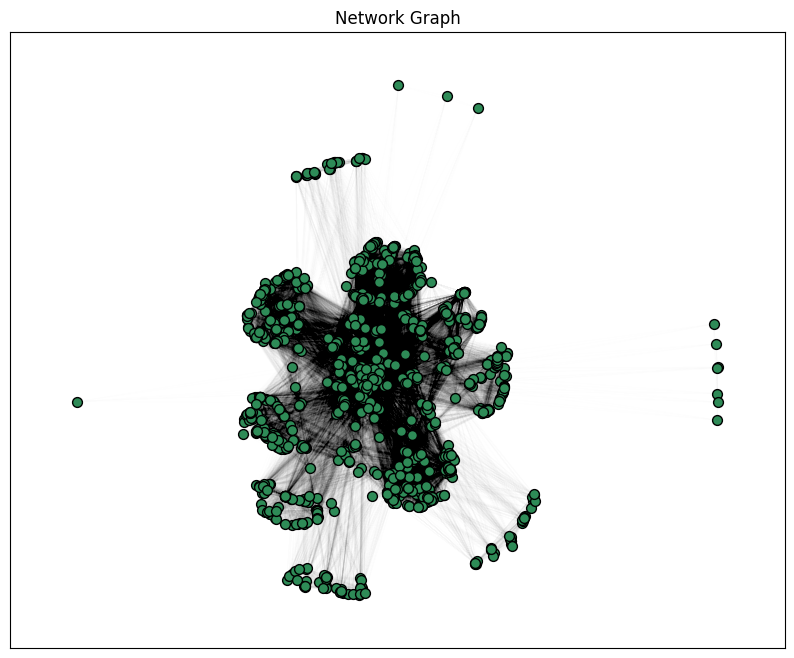

Here we see the core of the graph with several outlier groups. Let's zoom in to take a look at the core without the outliers.

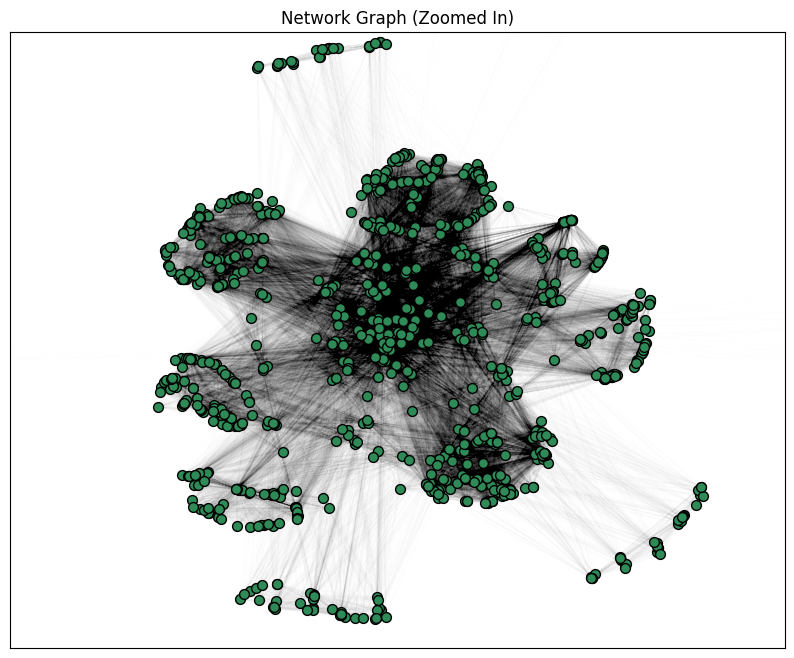

We see that the core is itself looks like a conglomerate of several groups. Since we are using a spring layout, the most interconnected nodes are brought to each other and are placed closer to the center. Let's zoom in further to take a look at the center of the core.

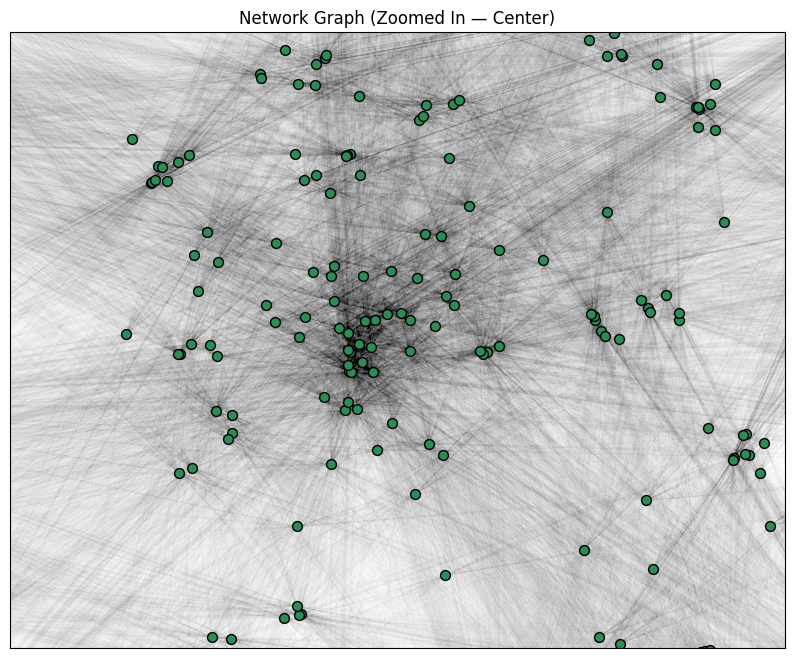

Given that we set alpha to .0025, which is extremely strong scaling down, to see dark black edges at the center will only mean that these are extremely interconnected nodes. Given the fact that we formed the graph based on the co-occurence of different named entities, these nodes probably occur in every source. They must have high centrality scores and be a center of the discourse arising from our sources.

## 4.1. Centrality Analysis
Goal: Identify central entities within the
knowledge graph using metrics like degree centrality or
betweenness centrality.

Thanks to `networkx` library we can compute all the necessary metrics in just a few lines of code:

```
# Calculate degree and betweennes centralities and store their values in a list.
degree_centrality = nx.degree_centrality(G)
centrality_values = list(degree_centrality.values())

betweenness_centrality = nx.betweenness_centrality(G)
btw_centrality_values = list(betweenness_centrality.values())
```

### 4.1.1. Degree Centrality

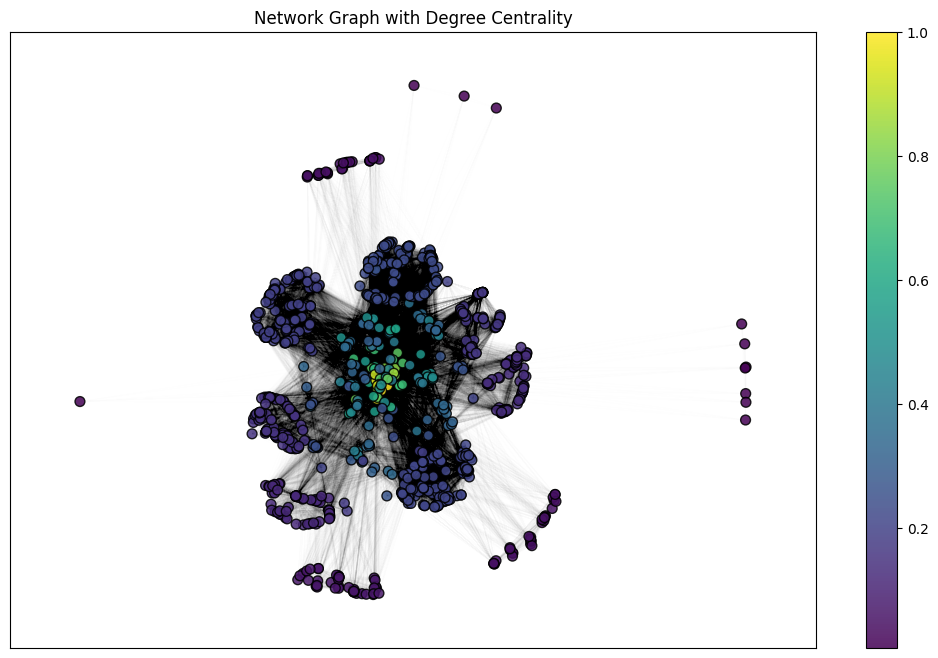

As I said, before, spring layout places most interconnected nodes in the center. Let's zoom in and inspect the core.

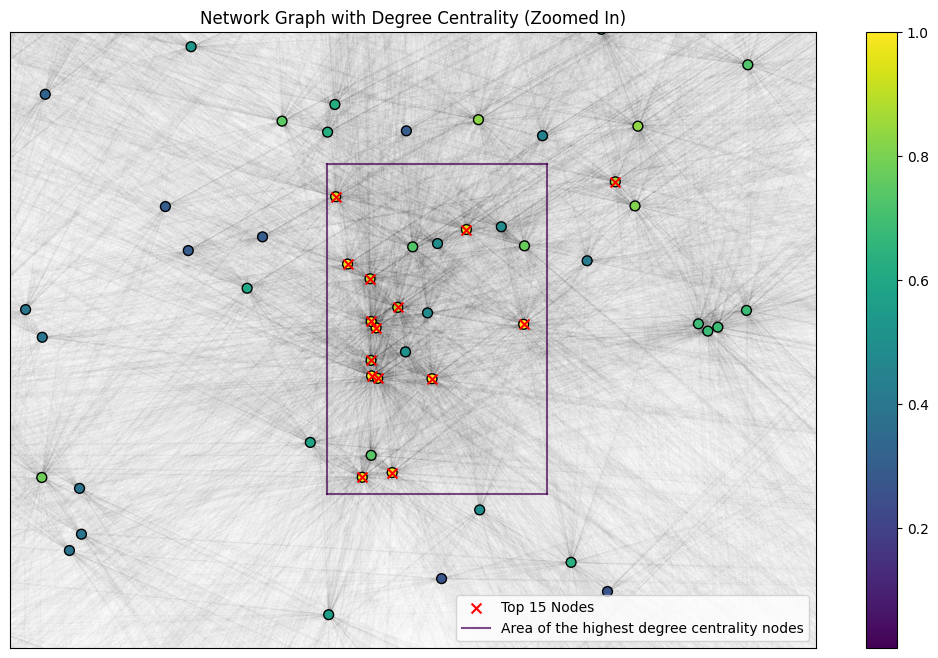

Indeed, the nodes with the highest degree centrality are clustered at the very center of the graph. Let's see, what are these nodes.

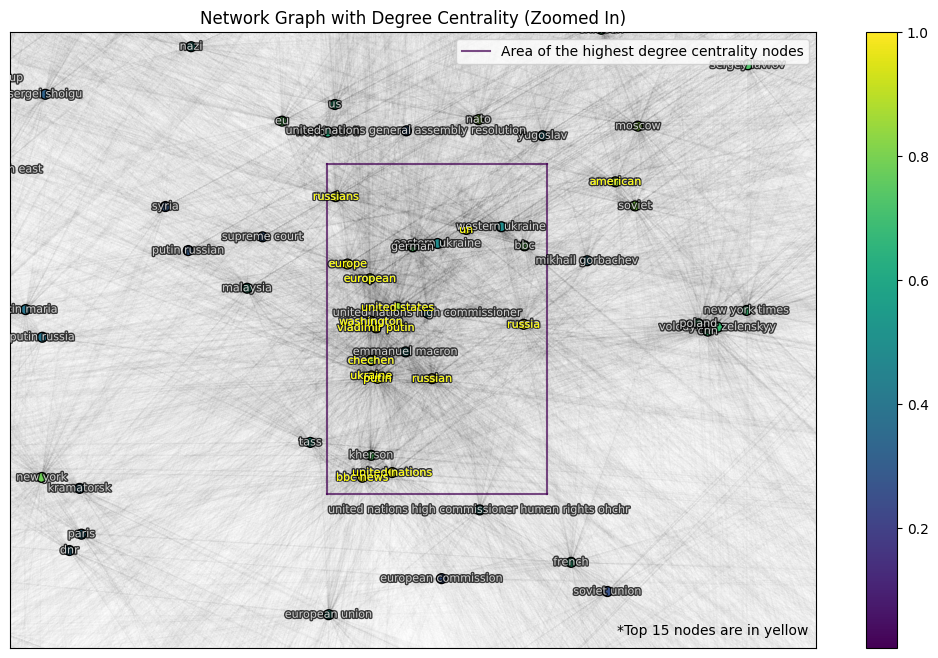

We see that the center of the discourse is constituted from a vocabulary that includes names of states, nations, cities, continents ('ukraine', 'russia', 'russian', 'united states', 'washington','chechen', 'europe', 'european'), international organisations ('united nations', 'un'), and even news outlets ('bbc news'). The striking thing is that among the most interconnected nodes, the only person to be in the list is vladimir putin ('putin'). We didn't find in the list Ukrainian, American or EU member-states leaders. Let's take a look at betweenness centrality.

### 4.1.2. Betweenness Centrality

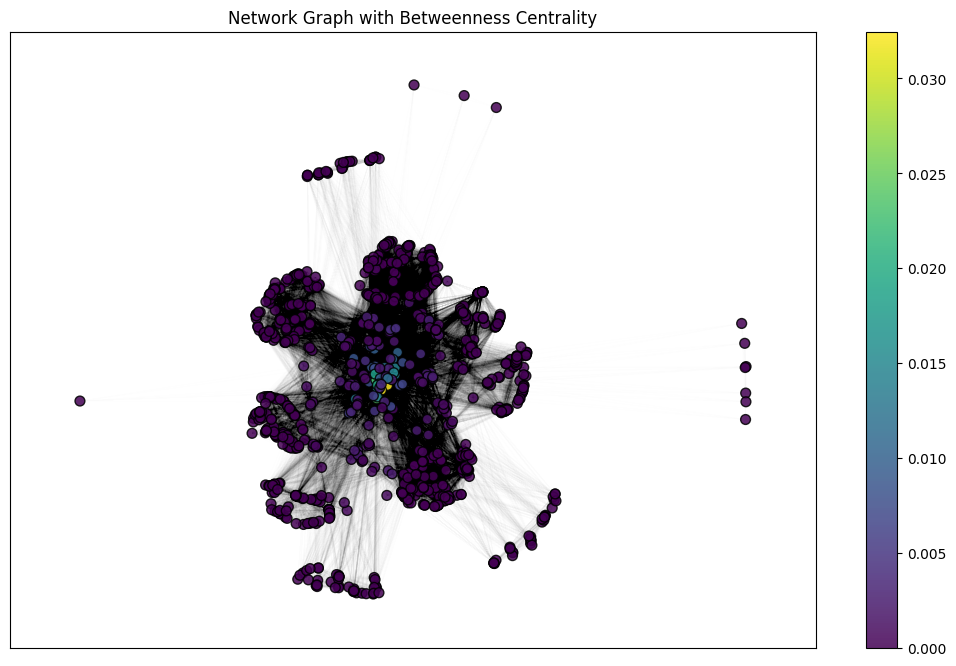

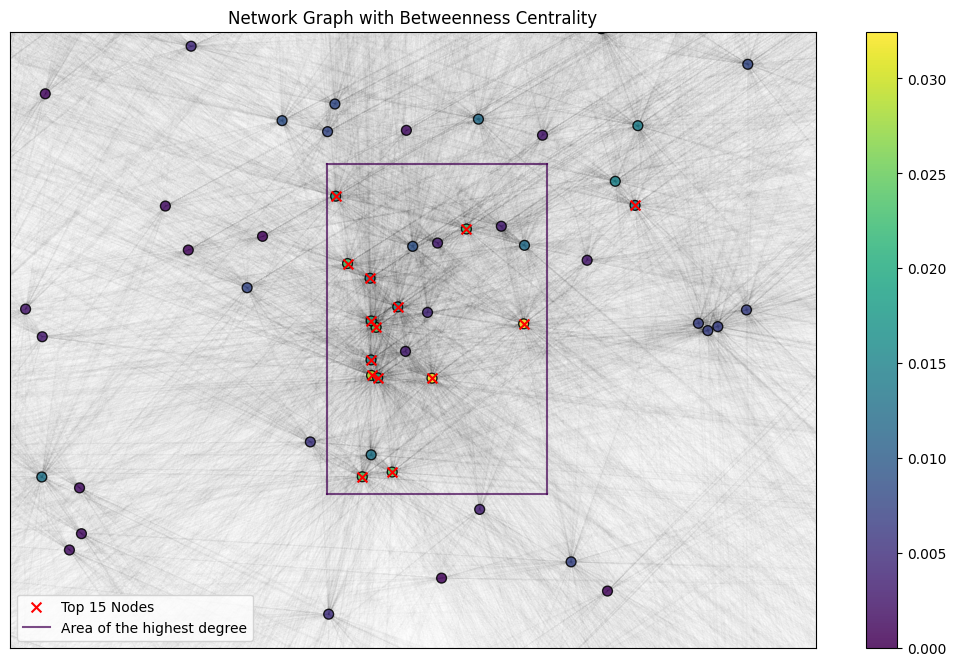

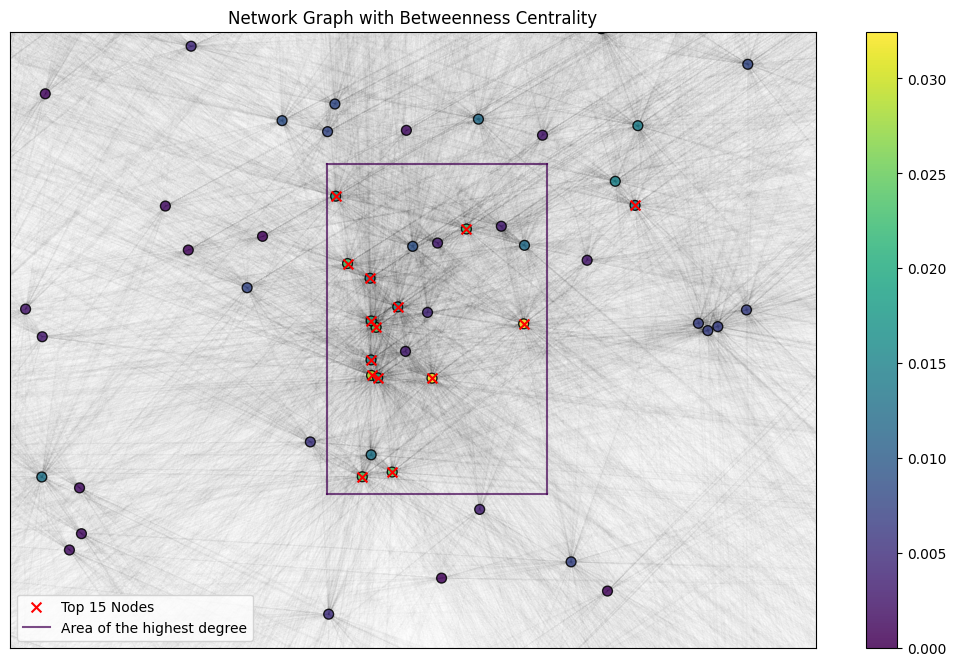

The list of the most interconnected nodes is the same, save for the presence of 'american' which is subsided with 'soviet'.

## 4.2. Cluster Analysis
Goal: Group entities into clusters based on their
relationships, helping to identify thematic groups.

Let's look for clusters apply clustering algorithms to the adjacency matrix. We start from the classic k-means.

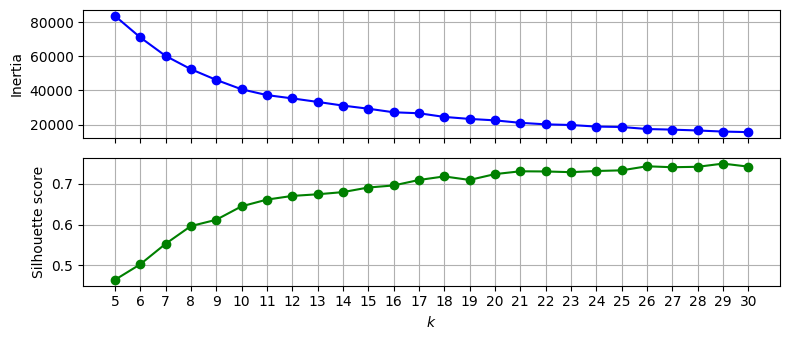

First we have to choose an appropriate k. For this, I've created a plot of inertia score and sillhouette score versus k. Because sillhouette score doesn't indicate a clear winner, I decided the stick to the 'elbow rule' and choose k=10 based on the inertia-vs-k chart.

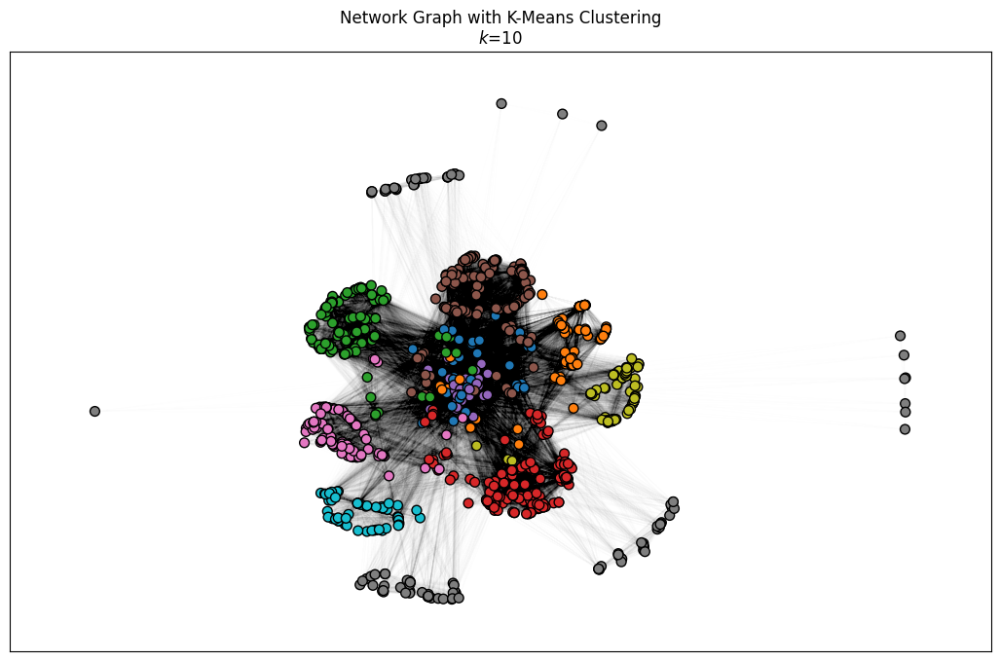

The resutls are good for the the 'outer core' cluster but the center is pieced between different clusters. Let's apply density-based algorithms instead. Below is the application of DBSCAN, HDBSCAN, and OPTICS to the graph.

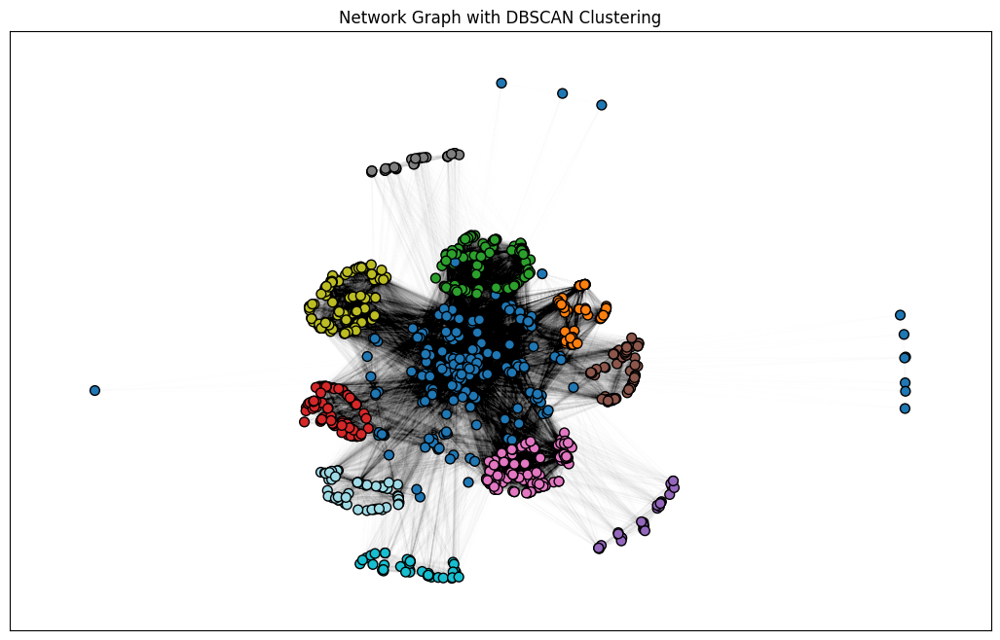

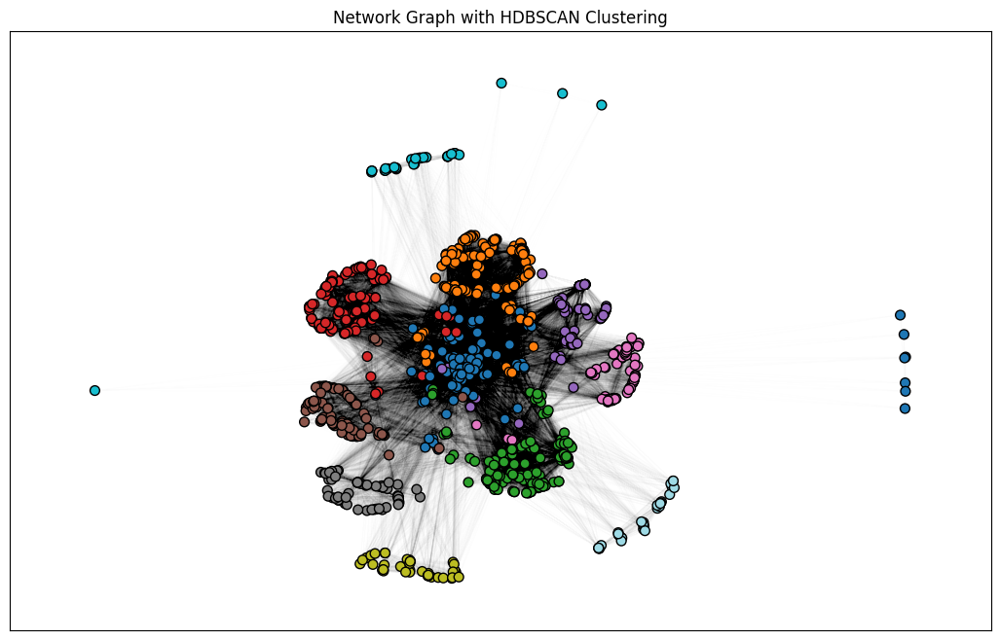

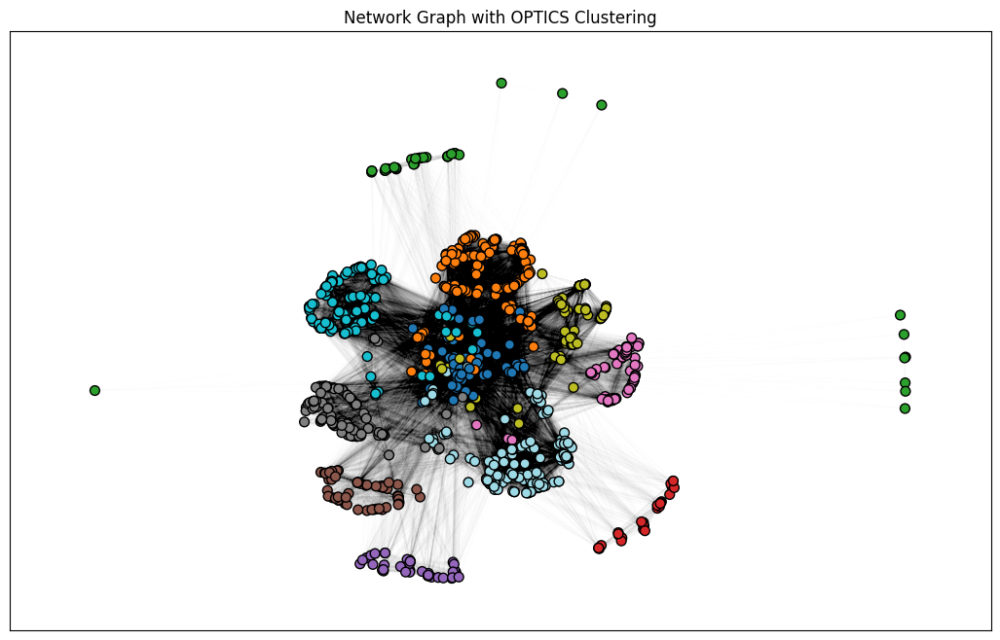

For me, the winner is DBSCAN for it created a clear center core. Now, let's look for different clusters with labels. Below is a technical plot wiht a grid and cluster centers as red dots that I identified experimentally.

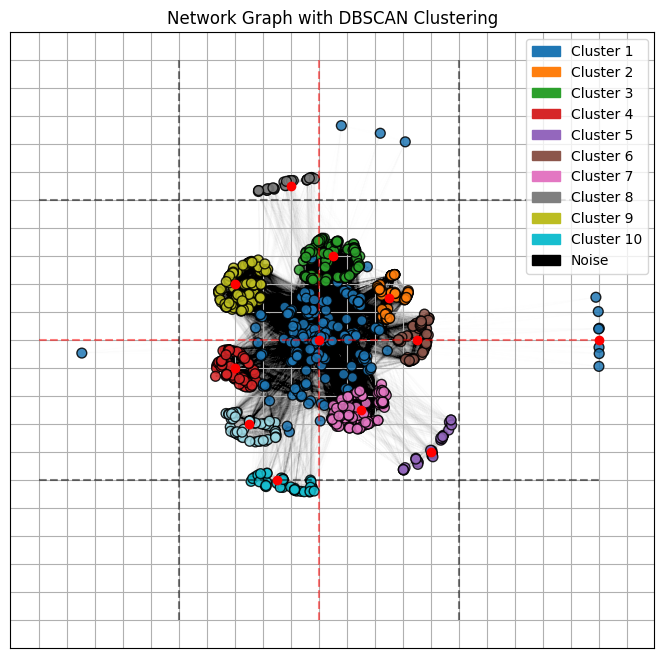

Now, we will iterate over groups and see what entities are linked together.

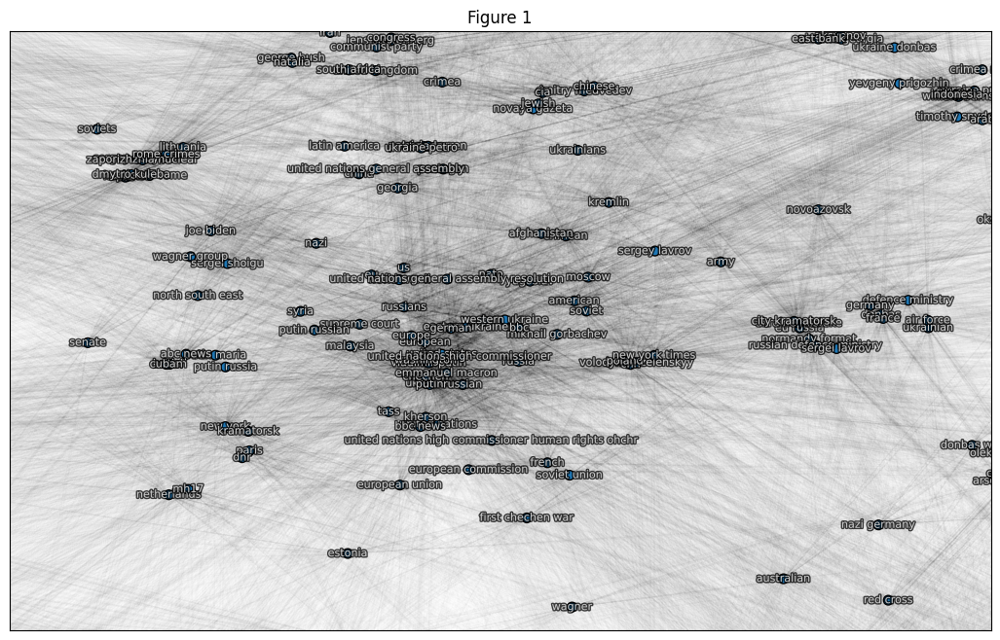
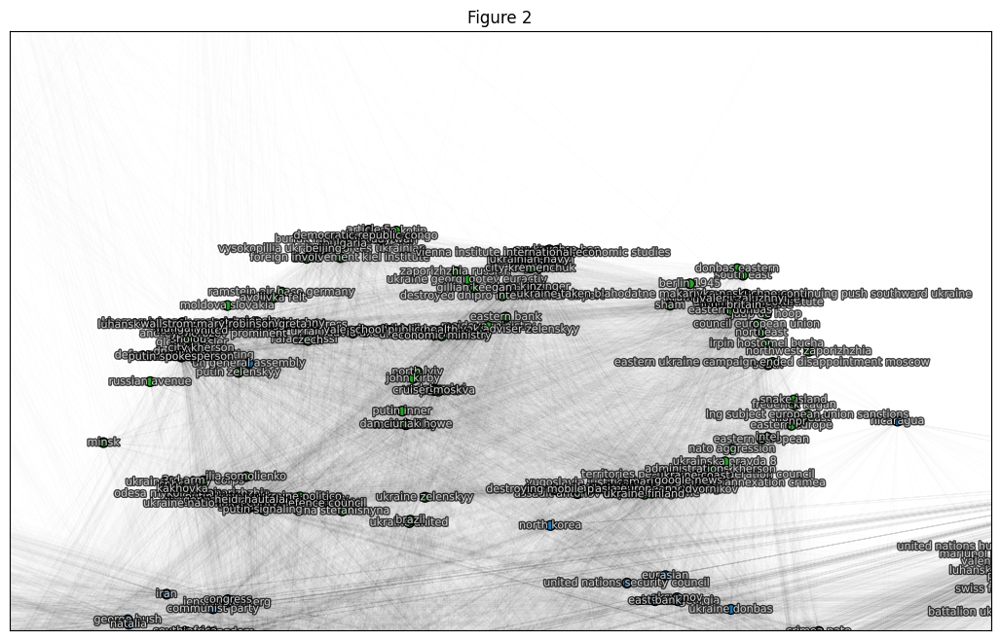
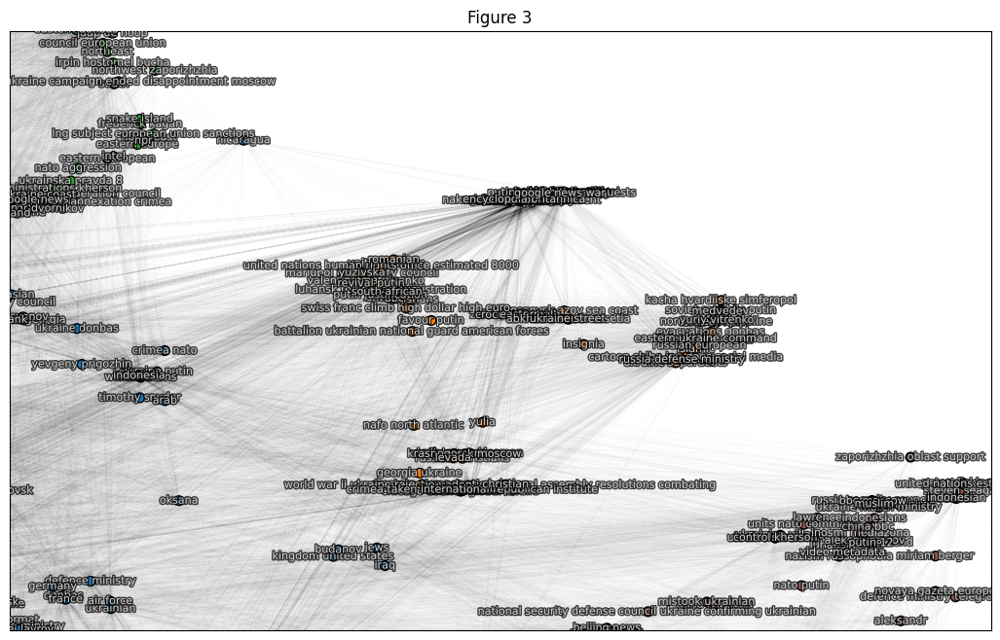
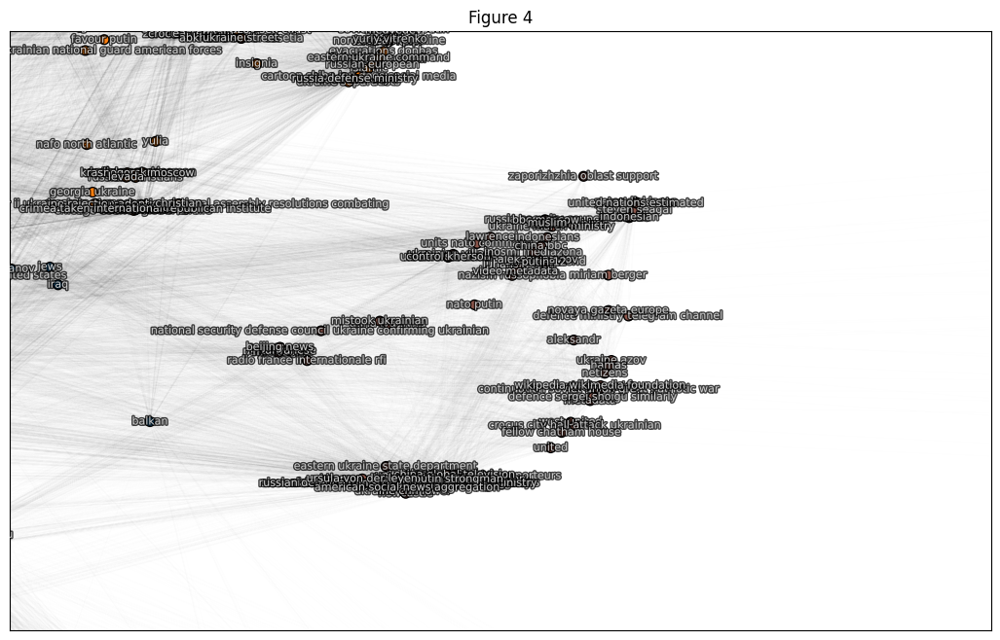
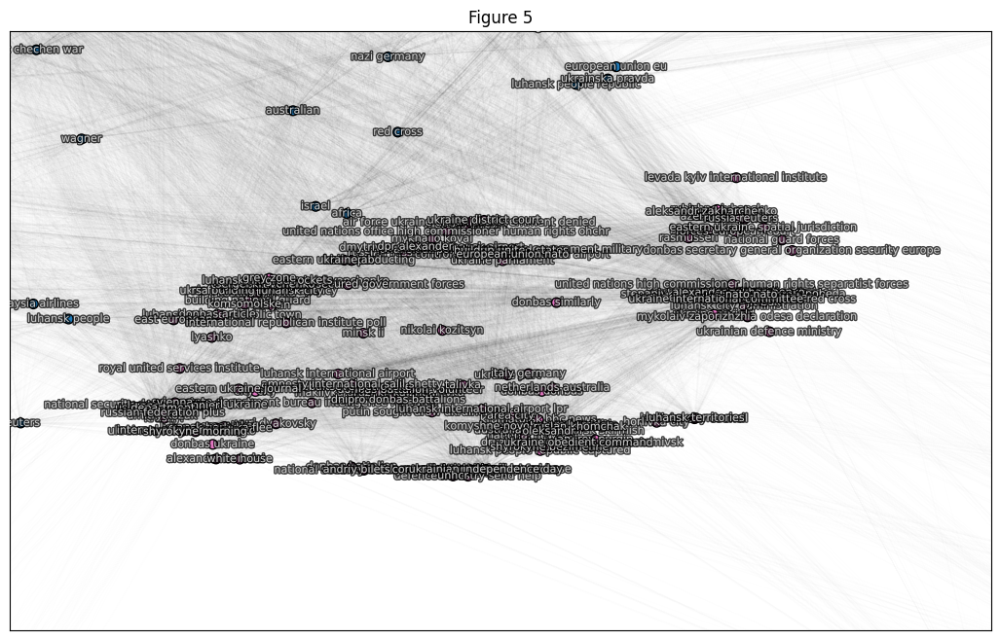
...
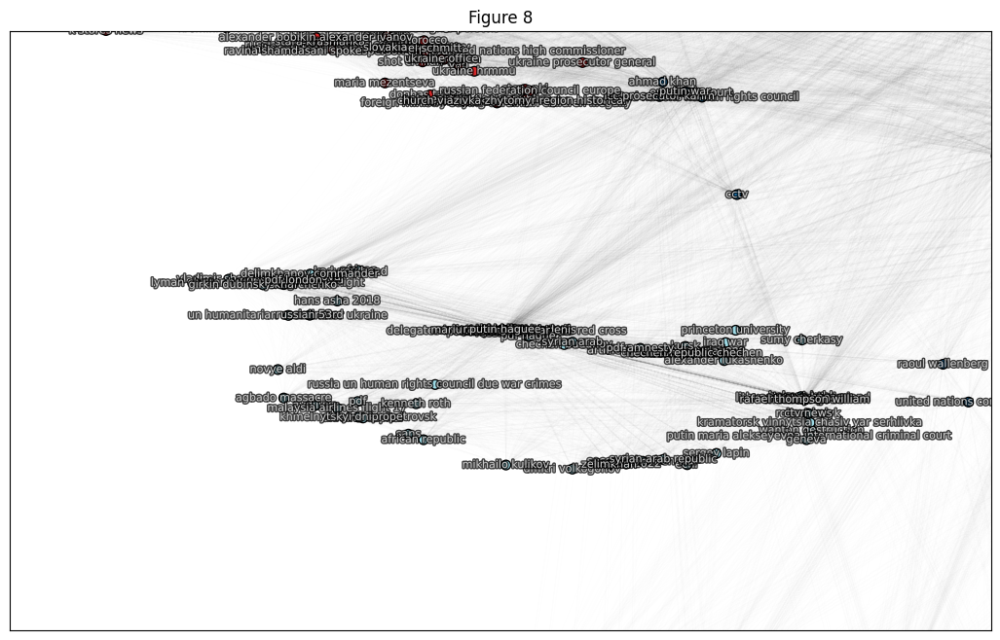
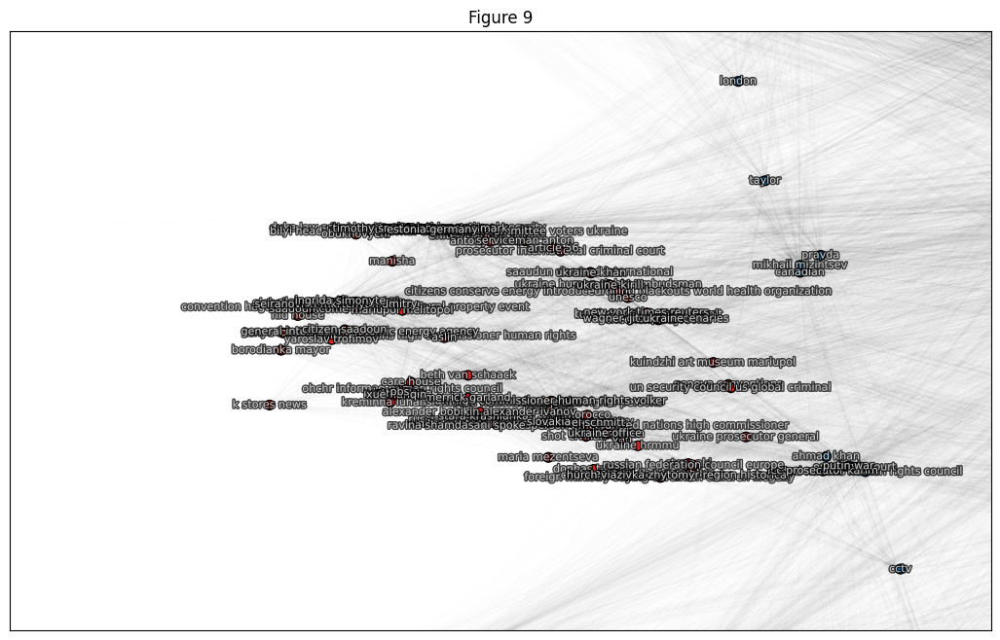
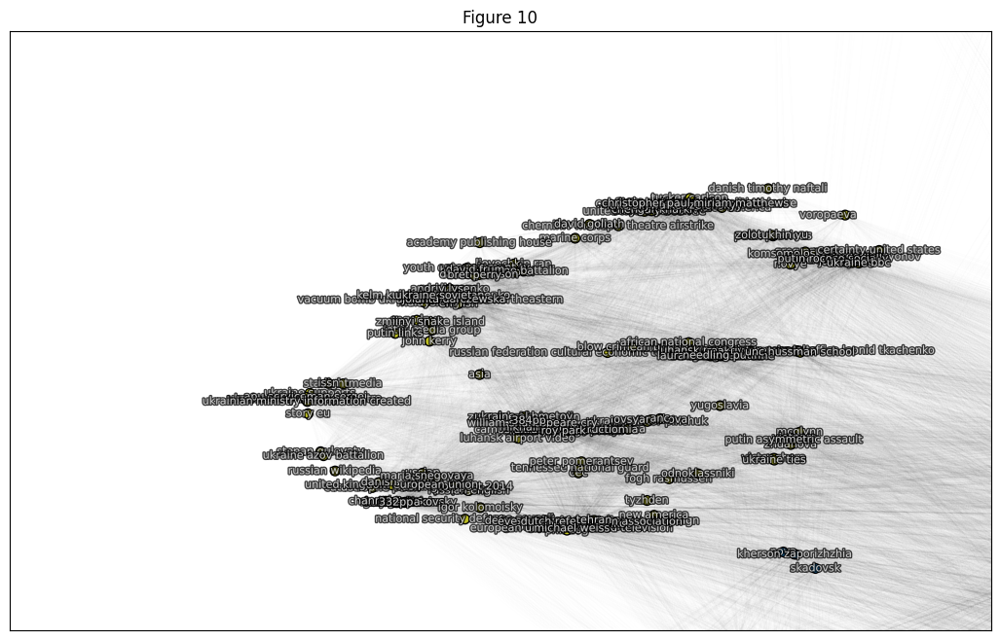
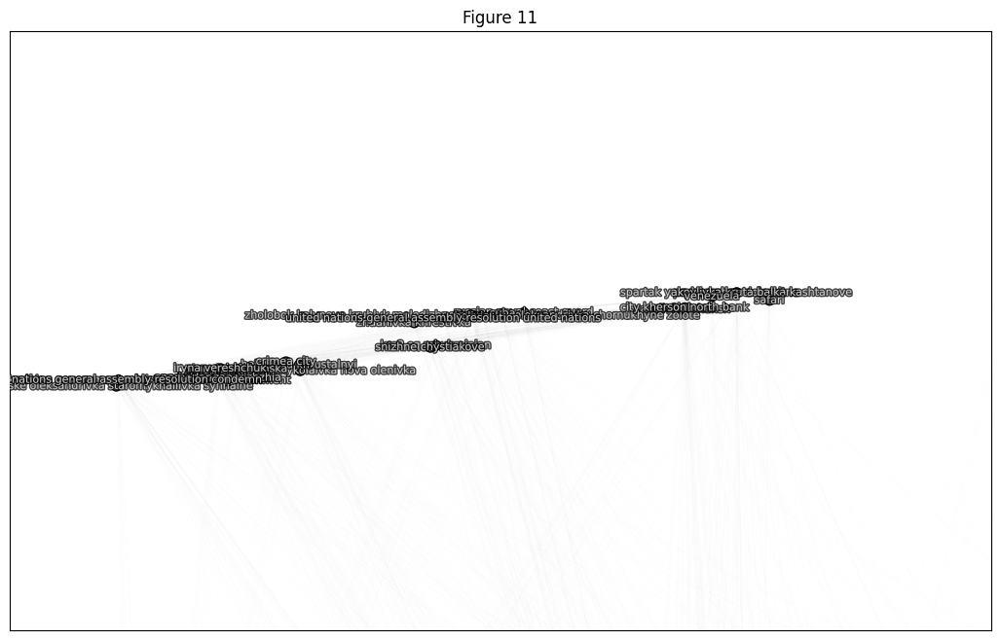
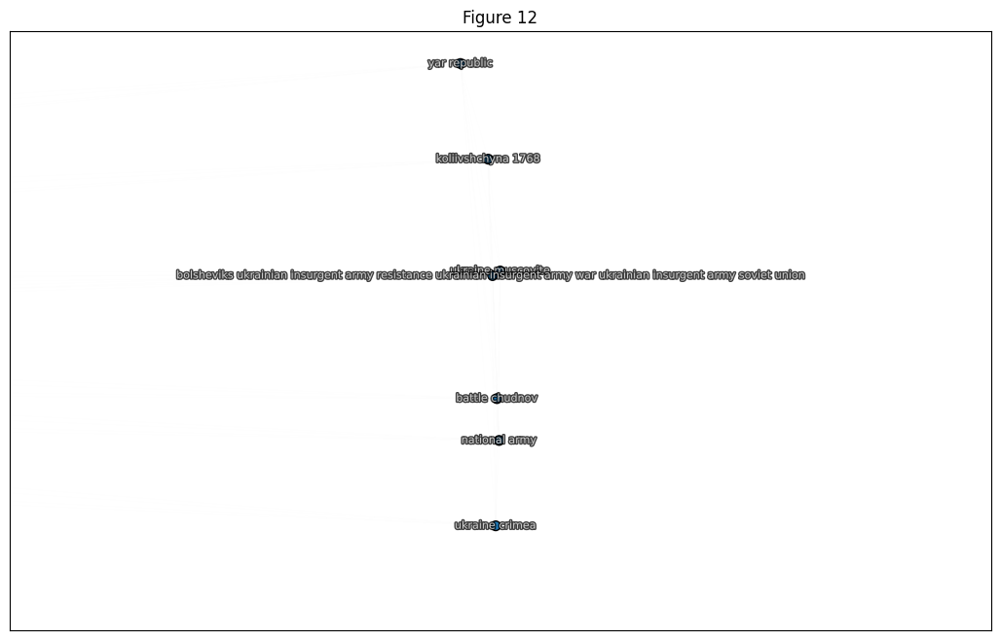

Here we can see sevelar things:

1. Our NER model had a quirk, it extracted not only the actual named entities but sometimes a combination of those entities. We see 'putin' in almost any clusterk. However, additional mentions frequently do not add much new information. As a result, graph looks saturated with repetitions. So, for future work a more sophisticated filtering is required.
2. Execept for the center of the graph depicted on the Fig.1 which represents the "center" of the discourse and the last figure (Fig. 12) which clearly refers to the Ukrainian historical events, all the other groups looks like a microcosm with similar vocabulary. The clusters aren't grouped by similarity. This may be because each cluster represents a particular source. For a more clear interpretation, further inspection of sources is needed.

This concludes the fourth phase of a project.
<hr>

Illia Nesterenko, <br>
CSAI-12